https://s3.amazonaws.com/tripdata/index.html

In [1]:
# Step 1: Import pandas
import pandas as pd
import pandas as pd
import plotly.express as px

import osmnx as ox
import networkx as nx


from datetime import datetime


import numpy as np
import pandas as pd

import requests
import xml.etree.ElementTree as ET
from tqdm import tqdm

# getting necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Plotting
import plotly.express as px


# Step 2: Read the CSV file
file_path = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/12_December/202312-citibike-tripdata_3.csv'  # Replace with the path to your CSV file
df = pd.read_csv(file_path)

/var/folders/wm/w3d80c152lq65mt41y20p1200000gn/T/ipykernel_4952/1269173687.py:33: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [2]:
df['started_at'] = pd.to_datetime(df['started_at'])
df['ended_at'] = pd.to_datetime(df['ended_at'])

df['Duration'] = df['ended_at'] - df['started_at']

In [3]:
print(df)

                 ride_id rideable_type          started_at  \
0       FB81AC70BBE6A468  classic_bike 2023-12-07 11:26:27   
1       75B358491F447D9A  classic_bike 2023-12-05 05:52:13   
2       DBB3F24147152EDF  classic_bike 2023-12-05 12:07:08   
3       C3F0015643BA2AE7  classic_bike 2023-12-16 11:38:42   
4       5949386BEEA73393  classic_bike 2023-12-03 19:05:31   
...                  ...           ...                 ...   
273660  796BC679FFED8FB8  classic_bike 2023-12-14 10:01:36   
273661  A8FFE1251749A510  classic_bike 2023-12-14 10:13:42   
273662  AC14339B505A0000  classic_bike 2023-12-14 10:09:56   
273663  FC3702FD4319EC93  classic_bike 2023-12-14 10:03:47   
273664  930E4226552E06D8  classic_bike 2023-12-17 13:15:50   

                  ended_at      start_station_name start_station_id  \
0      2023-12-07 11:29:54         6 Ave & W 34 St          6364.10   
1      2023-12-05 05:54:50            4 Ave & 3 St          4028.04   
2      2023-12-05 12:24:18   Park Circle &

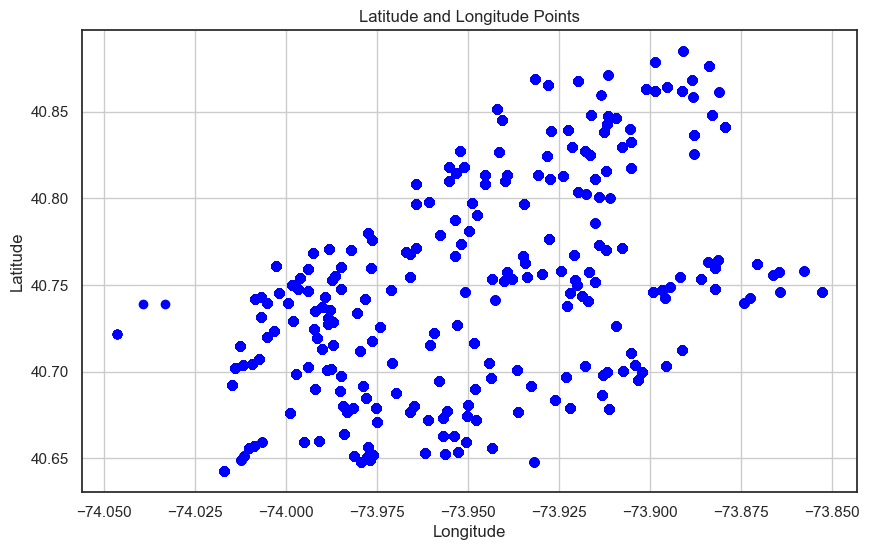

In [4]:
import matplotlib.pyplot as plt

# Plotting the points
plt.figure(figsize=(10, 6))
plt.scatter(df['end_lng'], df['end_lat'], c='blue', marker='o')

# Adding titles and labels
plt.title('Latitude and Longitude Points')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show grid
plt.grid(True)

# Display the plot
plt.show()

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact
 
 
def interactive_plot(amplitude, frequency):
    x = np.linspace(0, 2 * np.pi, 1000)
    y = amplitude * np.sin(frequency * x)
    plt.figure(figsize=(8, 4))
    plt.plot(x, y)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title('Interactive Sine Wave')
    plt.grid(True)
    plt.show()
 
 
interact(interactive_plot, amplitude=(1, 5, 0.1), frequency=(1, 10, 0.1))

In [ ]:
import leafmap as leafmap
print(leafmap.basemaps.keys())

dict_keys(['OpenStreetMap', 'Google Maps', 'Google Satellite', 'Google Terrain', 'Google Hybrid', 'FWS NWI Wetlands', 'FWS NWI Wetlands Raster', 'NLCD 2021 CONUS Land Cover', 'NLCD 2019 CONUS Land Cover', 'NLCD 2016 CONUS Land Cover', 'NLCD 2013 CONUS Land Cover', 'NLCD 2011 CONUS Land Cover', 'NLCD 2008 CONUS Land Cover', 'NLCD 2006 CONUS Land Cover', 'NLCD 2004 CONUS Land Cover', 'NLCD 2001 CONUS Land Cover', 'USGS NAIP Imagery', 'USGS NAIP Imagery False Color', 'USGS NAIP Imagery NDVI', 'USGS Hydrography', 'USGS 3DEP Elevation', 'ESA Worldcover 2020', 'ESA Worldcover 2020 S2 FCC', 'ESA Worldcover 2020 S2 TCC', 'ESA Worldcover 2021', 'ESA Worldcover 2021 S2 FCC', 'ESA Worldcover 2021 S2 TCC', 'BasemapAT.basemap', 'BasemapAT.grau', 'BasemapAT.highdpi', 'BasemapAT.orthofoto', 'BasemapAT.overlay', 'BasemapAT.surface', 'BasemapAT.terrain', 'CartoDB.DarkMatter', 'CartoDB.DarkMatterNoLabels', 'CartoDB.DarkMatterOnlyLabels', 'CartoDB.Positron', 'CartoDB.PositronNoLabels', 'CartoDB.PositronO

In [ ]:
leafmap.split_map(left_layer="ROADMAP", right_layer="HYBRID")
leafmap.split_map(
    left_layer="Esri.WorldTopoMap", right_layer="OpenTopoMap", zoom_control=False
)

leafmap.split_map(
    left_layer="NLCD 2001 CONUS Land Cover",
    right_layer="NLCD 2016 CONUS Land Cover",
    left_label="2001",
    right_label="2016",
    label_position="bottom",
    center=[36.1, -114.9],
    zoom=10,
)

Map(center=[36.1, -114.9], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [ ]:
print(df)

                 ride_id rideable_type          started_at  \
0       FB81AC70BBE6A468  classic_bike 2023-12-07 11:26:27   
1       75B358491F447D9A  classic_bike 2023-12-05 05:52:13   
2       DBB3F24147152EDF  classic_bike 2023-12-05 12:07:08   
3       C3F0015643BA2AE7  classic_bike 2023-12-16 11:38:42   
4       5949386BEEA73393  classic_bike 2023-12-03 19:05:31   
...                  ...           ...                 ...   
273660  796BC679FFED8FB8  classic_bike 2023-12-14 10:01:36   
273661  A8FFE1251749A510  classic_bike 2023-12-14 10:13:42   
273662  AC14339B505A0000  classic_bike 2023-12-14 10:09:56   
273663  FC3702FD4319EC93  classic_bike 2023-12-14 10:03:47   
273664  930E4226552E06D8  classic_bike 2023-12-17 13:15:50   

                  ended_at      start_station_name start_station_id  \
0      2023-12-07 11:29:54         6 Ave & W 34 St          6364.10   
1      2023-12-05 05:54:50            4 Ave & 3 St          4028.04   
2      2023-12-05 12:24:18   Park Circle &

In [ ]:
print(df.head(3))

            ride_id rideable_type          started_at            ended_at  \
0  FB81AC70BBE6A468  classic_bike 2023-12-07 11:26:27 2023-12-07 11:29:54   
1  75B358491F447D9A  classic_bike 2023-12-05 05:52:13 2023-12-05 05:54:50   
2  DBB3F24147152EDF  classic_bike 2023-12-05 12:07:08 2023-12-05 12:24:18   

      start_station_name start_station_id           end_station_name  \
0        6 Ave & W 34 St          6364.10         Broadway & W 38 St   
1           4 Ave & 3 St          4028.04        Douglass St & 4 Ave   
2  Park Circle & East Dr          3344.02  Sterling St & Bedford Ave   

  end_station_id  start_lat  start_lng    end_lat    end_lng member_casual  \
0        6560.15  40.749656 -73.988212  40.752973 -73.987349        member   
1        4175.14  40.673746 -73.985649  40.679279 -73.981540        member   
2        3665.06  40.651566 -73.972212  40.662706 -73.956912        casual   

         Duration  
0 0 days 00:03:27  
1 0 days 00:02:37  
2 0 days 00:17:10  


### An interactive scrolling map of the starting lat/lon points of citi-bikes including a heatmap, which highlights the duration of each trip from where it starts

In [ ]:
# Data with latitude/longitude and values

fig = px.density_mapbox(df, lat = 'start_lat', lon = 'start_lng', z = 'Duration',
                        radius = 8,
                        center = dict(lat = 40.7128, lon = -74.0060),
                        zoom = 10,
                        mapbox_style = 'open-street-map')
fig.show()

#### Create a function that finds the most efficient bike path for one of the trips

Assumptions:
- We bike rationally, this assumes shortest distance but how many people actually follow road rules and wouldn't run a red light

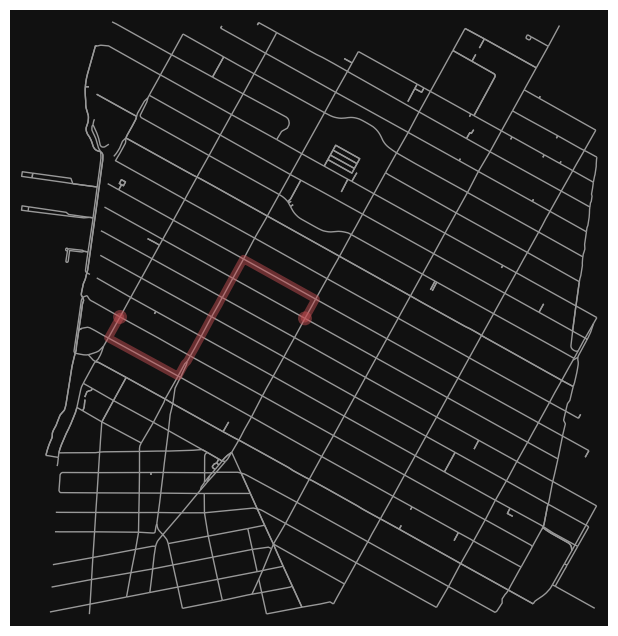

In [ ]:
BikeTripNum = 231

start_lat = df.loc[BikeTripNum]['start_lat']
start_lng = df.loc[BikeTripNum]['start_lng']
end_lat = df.loc[BikeTripNum]['end_lat']
end_lng = df.loc[BikeTripNum]['end_lng']

start_point = (start_lat, start_lng)
end_point = (end_lat, end_lng) 

# Download the street network for the area containing the start and end points
G = ox.graph_from_point(start_point, dist=1000, network_type='bike')

# Find the nearest nodes in the network to the start and end points
start_node = ox.nearest_nodes(G, start_point[1], start_point[0])
end_node = ox.nearest_nodes(G, end_point[1], end_point[0])

# Find the shortest path using Dijkstra's algorithm
shortest_path = nx.shortest_path(G, start_node, end_node, weight='length')
# Plot the route
fig, ax = ox.plot_graph_route(G, shortest_path, route_linewidth=6, node_size=0)



### Let's test citibike data across months, to see if it is seasonal

In [ ]:
#Import Data

file_path_1 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/1_January/202301-citibike-tripdata_1.csv'
df_1 = pd.read_csv(file_path_1)

file_path_2 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/2_February/202302-citibike-tripdata_1.csv'
df_2 = pd.read_csv(file_path_2)

file_path_3 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/3_March/202303-citibike-tripdata_1.csv'
df_3 = pd.read_csv(file_path_3)

file_path_4 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/4_April/202304-citibike-tripdata_1.csv'
df_4 = pd.read_csv(file_path_4)

file_path_5 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/5_May/202305-citibike-tripdata_1.csv'
df_5 = pd.read_csv(file_path_5)

file_path_6 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/6_June/202306-citibike-tripdata_1.csv'
df_6 = pd.read_csv(file_path_6)

file_path_7 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/7_July/202307-citibike-tripdata_1.csv'
df_7 = pd.read_csv(file_path_7)

file_path_8 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/8_August/202308-citibike-tripdata_1.csv'
df_8 = pd.read_csv(file_path_8)

file_path_9 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/9_September/202309-citibike-tripdata_1.csv'
df_9 = pd.read_csv(file_path_9)

file_path_10 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/10_October/202310-citibike-tripdata_1.csv'
df_10 = pd.read_csv(file_path_10)

file_path_11 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/11_November/202311-citibike-tripdata_1.csv'
df_11 = pd.read_csv(file_path_11)

file_path_12 = '/Users/bricenfisher/Downloads/2023-citibike-tripdata/12_December/202312-citibike-tripdata_1.csv'
df_12 = pd.read_csv(file_path_12)


In [ ]:

df_1['started_at'] = pd.to_datetime(df_1['started_at'])
df_1['ended_at'] = pd.to_datetime(df_1['ended_at'])
df_1['Duration'] = df_1['ended_at'] - df_1['started_at']


df_2['started_at'] = pd.to_datetime(df_2['started_at'])
df_2['ended_at'] = pd.to_datetime(df_2['ended_at'])
df_2['Duration'] = df_2['ended_at'] - df_2['started_at']


df_3['started_at'] = pd.to_datetime(df_3['started_at'])
df_3['ended_at'] = pd.to_datetime(df_3['ended_at'])
df_3['Duration'] = df_3['ended_at'] - df_3['started_at']


df_4['started_at'] = pd.to_datetime(df_4['started_at'])
df_4['ended_at'] = pd.to_datetime(df_4['ended_at'])
df_4['Duration'] = df_4['ended_at'] - df_4['started_at']


df_5['started_at'] = pd.to_datetime(df_5['started_at'])
df_5['ended_at'] = pd.to_datetime(df_5['ended_at'])
df_5['Duration'] = df_5['ended_at'] - df_5['started_at']


df_6['started_at'] = pd.to_datetime(df_6['started_at'])
df_6['ended_at'] = pd.to_datetime(df_6['ended_at'])
df_6['Duration'] = df_6['ended_at'] - df_6['started_at']


df_7['started_at'] = pd.to_datetime(df_7['started_at'])
df_7['ended_at'] = pd.to_datetime(df_7['ended_at'])
df_7['Duration'] = df_7['ended_at'] - df_7['started_at']


df_8['started_at'] = pd.to_datetime(df_8['started_at'])
df_8['ended_at'] = pd.to_datetime(df_8['ended_at'])
df_8['Duration'] = df_8['ended_at'] - df_8['started_at']


df_9['started_at'] = pd.to_datetime(df_9['started_at'])
df_9['ended_at'] = pd.to_datetime(df_9['ended_at'])
df_9['Duration'] = df_9['ended_at'] - df_9['started_at']


df_10['started_at'] = pd.to_datetime(df_10['started_at'])
df_10['ended_at'] = pd.to_datetime(df_10['ended_at'])
df_10['Duration'] = df_10['ended_at'] - df_10['started_at']


df_11['started_at'] = pd.to_datetime(df_11['started_at'])
df_11['ended_at'] = pd.to_datetime(df_11['ended_at'])
df_11['Duration'] = df_11['ended_at'] - df_11['started_at']


df_12['started_at'] = pd.to_datetime(df_12['started_at'])
df_12['ended_at'] = pd.to_datetime(df_12['ended_at'])
df_12['Duration'] = df_12['ended_at'] - df_12['started_at']

In [ ]:
df_1['Month'] = "Jan"
df_2['Month'] = "Feb"
df_3['Month'] = "Mar"
df_4['Month'] = "Apr"
df_5['Month'] = "May"
df_6['Month'] = "Jun"
df_7['Month'] = "Jul"
df_8['Month'] = "Aug"
df_9['Month'] = "Sep"
df_10['Month'] = "Oct"
df_11['Month'] = "Nov"
df_12['Month'] = "Dec"

In [ ]:
#Just to build out code, im trunkating the data

howmuchrows = 20

In [ ]:
df_1 = df_1[:howmuchrows]
df_2 = df_2[:howmuchrows]
df_3 = df_3[:howmuchrows]
df_4 = df_4[:howmuchrows]
df_5 = df_5[:howmuchrows]
df_6 = df_6[:howmuchrows]
df_7 = df_7[:howmuchrows]
df_8 = df_8[:howmuchrows]
df_9 = df_9[:howmuchrows]
df_10 = df_10[:howmuchrows]
df_11 = df_11[:howmuchrows]
df_12 = df_12[:howmuchrows]



In [ ]:
summary_df_duration = pd.DataFrame()

dfs = {
    'Jan': df_1,
    'Feb': df_2,
    'Mar': df_3,
    'Apr': df_4,
    'May': df_5,
    'Jun': df_6,
    'Jul': df_7,
    'Aug': df_8,
    'Sep': df_9,
    'Oct': df_10,
    'Nov': df_11,
    'Dec': df_12
}

data = []



# Loop through each dataframe in the dictionary
for name, df in dfs.items():
    # Calculate mean, 25th percentile, and 75th percentile
    mean_values = df['Duration'].mean()
    percentile_25 = df['Duration'].quantile(0.25)
    percentile_75 = df['Duration'].quantile(0.75)

    data.append({
        'Month':name,
        'Mean': mean_values,
        'percentile_25': percentile_25,
        'percentile_75': percentile_75

    })


dataframe = pd.DataFrame(data)

print(dataframe)


   Month                   Mean          percentile_25          percentile_75
0    Jan 0 days 00:09:47.150000 0 days 00:01:35.500000 0 days 00:15:04.500000
1    Feb 0 days 00:11:32.650000        0 days 00:05:28 0 days 00:14:24.750000
2    Mar 0 days 00:11:58.050000 0 days 00:05:27.250000 0 days 00:14:55.250000
3    Apr 0 days 00:15:09.600000 0 days 00:08:27.500000        0 days 00:17:50
4    May 0 days 00:10:49.550000 0 days 00:04:52.500000 0 days 00:14:21.750000
5    Jun 0 days 00:15:02.150000 0 days 00:07:04.500000 0 days 00:17:18.250000
6    Jul 0 days 00:12:58.200000        0 days 00:03:47 0 days 00:16:25.500000
7    Aug 0 days 00:18:41.500000 0 days 00:07:25.500000 0 days 00:23:30.250000
8    Sep 0 days 00:19:45.100000        0 days 00:05:49 0 days 00:18:07.250000
9    Oct 0 days 00:13:24.550000 0 days 00:00:37.750000 0 days 00:18:11.500000
10   Nov 0 days 00:38:41.400000 0 days 00:07:10.250000 0 days 00:17:12.500000
11   Dec 0 days 00:10:56.350000        0 days 00:06:11        0 

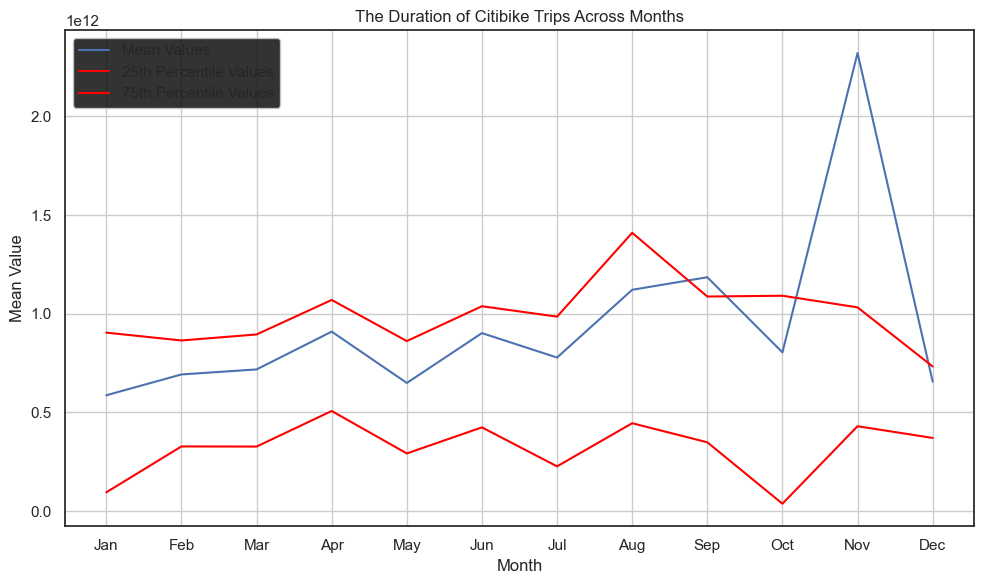

In [ ]:
# Plotting the line chart
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.plot(dataframe['Month'], dataframe['Mean'].values, linestyle='-', color='b', label='Mean Values')
plt.plot(dataframe['Month'], dataframe['percentile_25'].values, linestyle='-', color='red', label='25th Percentile Values')
plt.plot(dataframe['Month'], dataframe['percentile_75'].values, linestyle='-', color='red', label='75th Percentile Values')



# Adding labels and title
plt.xlabel('Month')
plt.ylabel('Mean Value')
plt.title('The Duration of Citibike Trips Across Months')
plt.grid(True)
plt.legend()

# Display the plot
plt.tight_layout()  # Ensures labels are not cut off
plt.show()

When you are using 20 points of data, per month, the first 20. The mean at Sep and Nov are more than the 75th percentile. Meaning it could be a skewed distribution or outliers

In [ ]:
result = pd.concat([df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9, df_10, df_11, df_12])


print(result)

             ride_id  rideable_type          started_at            ended_at  \
0   4A86C1475DCCADA0   classic_bike 2023-01-26 10:53:44 2023-01-26 11:05:17   
1   AE02E1FF7E264874   classic_bike 2023-01-04 11:51:54 2023-01-04 12:07:09   
2   D3F9A2A71AD244C6   classic_bike 2023-01-04 17:26:48 2023-01-04 17:43:29   
3   3D48C6F33AFEF329   classic_bike 2023-01-04 08:31:11 2023-01-04 08:42:12   
4   4865926C3D97BA01  electric_bike 2023-01-03 22:15:34 2023-01-03 22:30:35   
..               ...            ...                 ...                 ...   
15  31FED2A3BC86D981   classic_bike 2023-12-15 22:12:10 2023-12-15 22:15:02   
16  2B308EE735A8595D   classic_bike 2023-12-09 18:38:04 2023-12-09 18:44:29   
17  431CEBC96F50D787   classic_bike 2023-12-12 19:57:36 2023-12-12 19:59:30   
18  739D57AC2701E0A6   classic_bike 2023-12-11 17:17:34 2023-12-11 17:22:20   
19  0B06AC7B03949CE5   classic_bike 2023-12-29 18:18:22 2023-12-29 18:23:51   

                    start_station_name start_statio

In [ ]:
# we generate a pd.Serie with the mean temperature for each month (used later for colors in the FacetGrid plot), and we create a new column in temp dataframe
month_mean_serie = result.groupby('Month')['Duration'].mean()
result['mean_month'] = result['Month'].map(month_mean_serie)

#result['Duration'] = result['Duration'].apply(lambda x: x.timestamp())
result['Duration'] = result['Duration'].apply(lambda x: x.total_seconds())


month_dict = {1: 'Jan',
              2: 'Feb',
              3: 'Mar',
              4: 'Apr',
              5: 'May',
              6: 'Jun',
              7: 'Jul',
              8: 'Aug',
              9: 'Sep',
              10: 'Oct',
              11: 'Nov',
              12: 'Dec'}

AttributeError: 'float' object has no attribute 'total_seconds'

## Remove Outliers

In [ ]:
# Function to remove outliers from a specific column within each category
def remove_outliers_specific_column(df, col_name):
    df_clean = pd.DataFrame()
    for category, group in df.groupby('Month'):
        # Define your outlier removal logic for the specific column here
        column_data = group[col_name]
        # Example: remove outliers based on z-score
        mask = (np.abs(column_data - column_data.mean()) <= (3 * column_data.std()))
        df_clean = pd.concat([df_clean, group[mask]])
    return df_clean

# Specify the column for outlier removal
column_to_clean = 'Duration'

print(f"Original dataset size: {len(result)}")
# Remove outliers for the specified column
result = remove_outliers_specific_column(result, column_to_clean)

# Print cleaned dataset size
print(f"Cleaned dataset size: {len(result)}")

Original dataset size: 240
Cleaned dataset size: 233


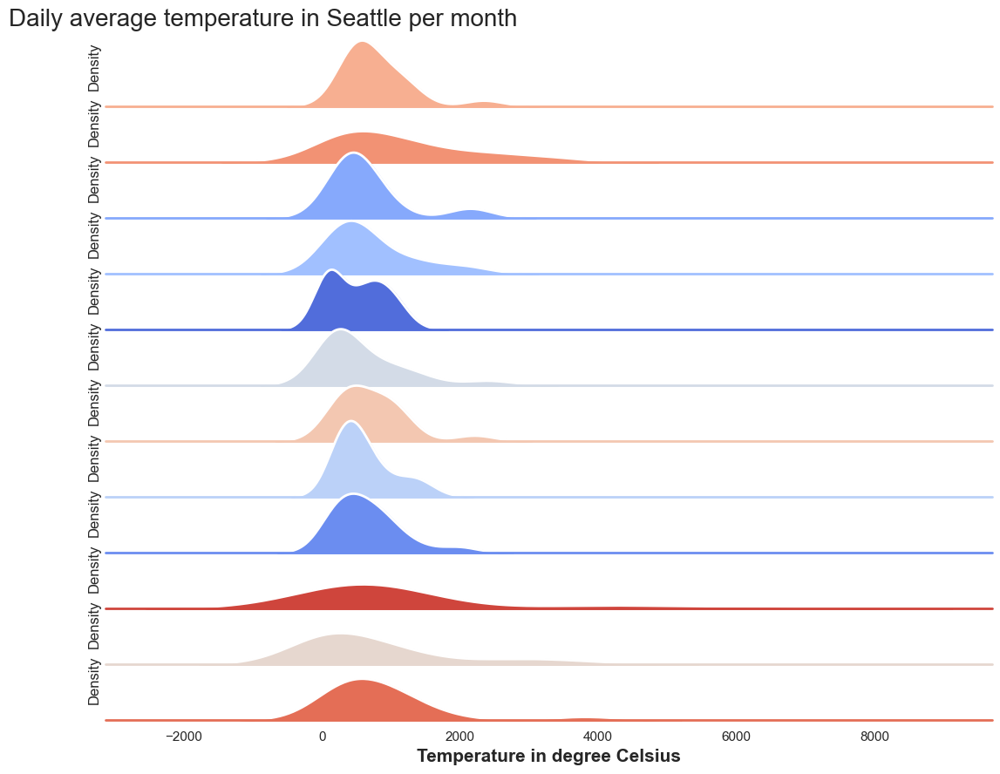

'\n# here we add a white line that represents the contour of each kdeplot\ng.map(sns.kdeplot, \'Duration\', \n      bw_adjust=1, clip_on=False, \n      color="w", lw=2)\n\n# here we add a horizontal line for each plot\ng.map(plt.axhline, y=0,\n      lw=2, clip_on=False)\n\n# we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color\n# notice how ax.lines[-1].get_color() enables you to access the last line\'s color in each matplotlib.Axes\nfor i, ax in enumerate(g.axes.flat):\n    ax.text(-15, 0.02, month_dict[i+1],\n            fontweight=\'bold\', fontsize=15,\n            color=ax.lines[-1].get_color())\n    \n# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap\ng.fig.subplots_adjust(hspace=-0.3)\n\n# eventually we remove axes titles, yticks and spines\ng.set_titles("")\ng.set(yticks=[])\ng.despine(bottom=True, left=True)\n\nplt.setp(ax.get_xticklabels(), fontsize=15, fontweight=\'bold\')\nplt.xlabel(\'Tempera

In [ ]:
# we generate a color palette with Seaborn.color_palette()
pal = sns.color_palette(palette='coolwarm', n_colors=12)

# in the sns.FacetGrid class, the 'hue' argument is the one that is the one that will be represented by colors with 'palette'
g = sns.FacetGrid(result, row='Month', hue='mean_month', aspect=15, height=0.75, palette=pal)

g.map(sns.kdeplot, 'Duration',
      bw_adjust=1, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)


# here we add a white line that represents the contour of each kdeplot
g.map(sns.kdeplot, 'Duration', 
      bw_adjust=1, clip_on=False, 
      color="w", lw=2)

# here we add a horizontal line for each plot
g.map(plt.axhline, y=0,
      lw=2, clip_on=False)

# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
g.fig.subplots_adjust(hspace=-0.3)

# eventually we remove axes titles, yticks and spines
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)

plt.setp(ax.get_xticklabels(), fontsize=15, fontweight='bold')
plt.xlabel('Temperature in degree Celsius', fontweight='bold', fontsize=15)
g.fig.suptitle('Daily average temperature in Seattle per month',
               ha='right',
               fontsize=20,
               fontweight=20)

plt.show()





"""
# here we add a white line that represents the contour of each kdeplot
g.map(sns.kdeplot, 'Duration', 
      bw_adjust=1, clip_on=False, 
      color="w", lw=2)

# here we add a horizontal line for each plot
g.map(plt.axhline, y=0,
      lw=2, clip_on=False)

# we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color
# notice how ax.lines[-1].get_color() enables you to access the last line's color in each matplotlib.Axes
for i, ax in enumerate(g.axes.flat):
    ax.text(-15, 0.02, month_dict[i+1],
            fontweight='bold', fontsize=15,
            color=ax.lines[-1].get_color())
    
# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
g.fig.subplots_adjust(hspace=-0.3)

# eventually we remove axes titles, yticks and spines
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)

plt.setp(ax.get_xticklabels(), fontsize=15, fontweight='bold')
plt.xlabel('Temperature in degree Celsius', fontweight='bold', fontsize=15)
g.fig.suptitle('Daily average temperature in Seattle per month',
               ha='right',
               fontsize=20,
               fontweight=20)

plt.show()

"""


Create a Ridge Plot

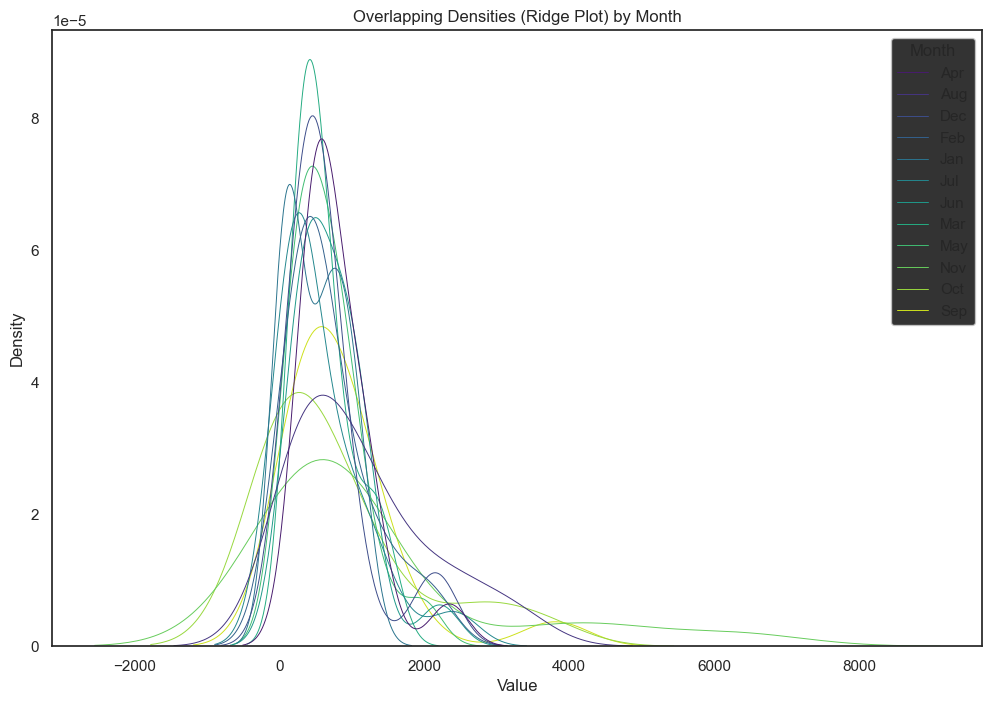

In [ ]:
# Create a ridge plot
plt.figure(figsize=(12, 8))
sns.kdeplot(data=result, x='Duration', hue='Month', multiple='layer', palette='viridis', linewidth=0.7)

plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Overlapping Densities (Ridge Plot) by Month')
plt.show()

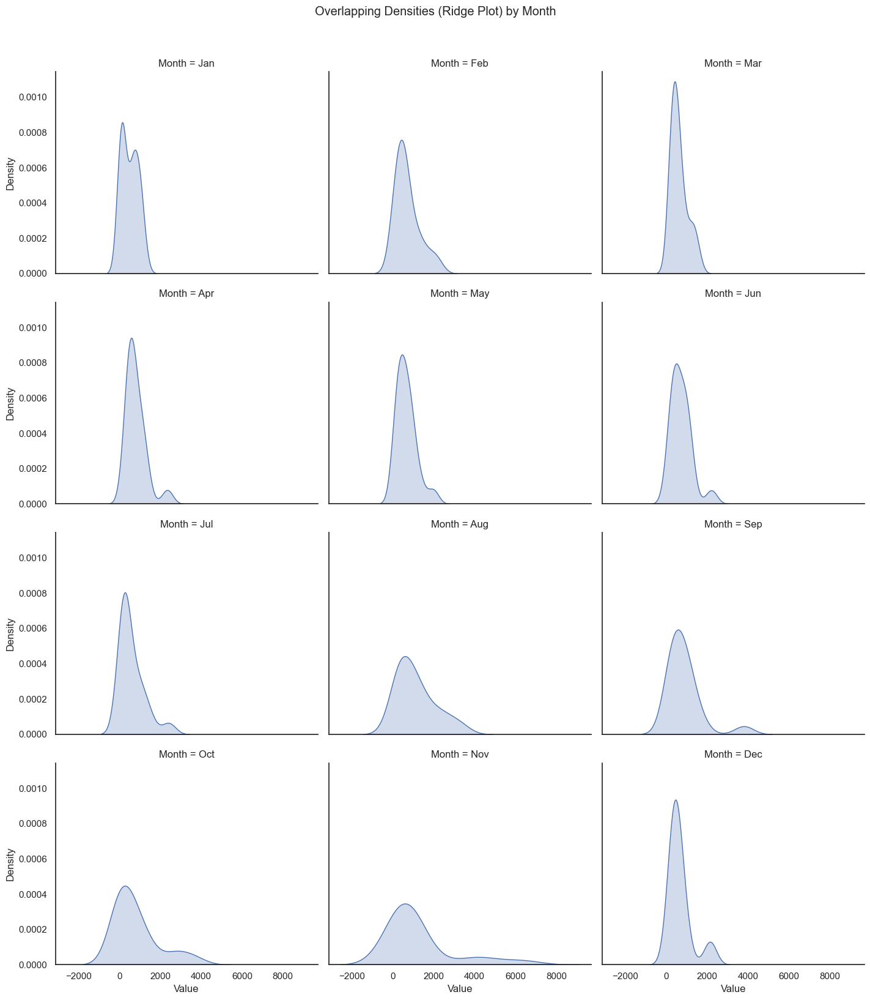

In [ ]:
# Generate example data
np.random.seed(0)
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul','Aug','Sep','Oct','Nov','Dec']


month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul','Aug','Sep','Oct','Nov','Dec']


# Create a grid of ridge plots for each month
g = sns.FacetGrid(result, col='Month', col_wrap=3, height=4, aspect=1.2, col_order=month_order)

g.map_dataframe(sns.kdeplot, x='Duration', fill=True, common_norm=False)
g.set_axis_labels('Value', 'Density')
g.fig.suptitle('Overlapping Densities (Ridge Plot) by Month', y=1.02)
plt.tight_layout()
plt.show()